<a href="https://colab.research.google.com/github/djouani/a2iml/blob/main/FaceTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import numpy as np
import pandas as pd
import cv2
import urllib
import glob
import sys
import time
import json
import matplotlib.pyplot as plt

import scipy

In [ ]:
!pip install PySimpleGUI

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.7/512.7 kB 4.4 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade tf_slim

In [ ]:
import PySimpleGUI as sg
import random

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, LeakyReLU, Dense, Dropout
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau

import os

In [ ]:
parent_dir = "/content/"
path = os.path.join(parent_dir, "dsClass")
os.mkdir(path)

parent_dir = "/content/"
path = os.path.join(parent_dir, "my_model1")
os.mkdir(path)

In [ ]:
t!cp -a /content/gdrive/MyDrive/Emotions/dsClass/*  /content/dsClass
!cp -a /content/gdrive/MyDrive/Emotions/my_model1/*  /content/my_model1

SyntaxError: ignored

In [ ]:
!cp -a /content/gdrive/MyDrive/Emotions/'haarcascade_frontalface_default.xml'  /content/
!cp -a /content/gdrive/MyDrive/Emotions/'Game of Thrones 3x10 Final Scene - Mhysa.mp4'  /content/

In [ ]:
!cp -a /content/gdrive/MyDrive/Emotions/'model-20170512-110547.ckpt-250000.index'   /content/
!cp -a /content/gdrive/MyDrive/Emotions/'model-20170512-110547.ckpt-250000.data-00000-of-00001'   /content/

In [ ]:
# GUI
# xxxx
class FaceDetector():
  def __init__(self,faceCascadePath):
      self.faceCascade=cv2.CascadeClassifier(faceCascadePath)


  def detect(self, image, scaleFactor=1.1,
            minNeighbors=5,
            minSize=(30,30)):
    #function return rectangle coordinates of faces for given image
      rects=self.faceCascade.detectMultiScale(image,
                                                scaleFactor=scaleFactor,
                                                minNeighbors=minNeighbors,
                                                minSize=minSize)
      return rects


def show_image(image):
    plt.figure(figsize=(18,15))
    #Before showing image, bgr color order transformed to rgb order
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([])
    plt.yticks([])
    plt.show()

#Frontal face of haar cascade loaded
frontal_cascade_path="haarcascade_frontalface_default.xml" #Cascade for faces

#Detector object created
fd=FaceDetector(frontal_cascade_path)


def detect_face(image, scaleFactor, minNeighbors, minSize,image_orig):
    # face will detected in gray image
    image_gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    faces=fd.detect(image_gray,
                   scaleFactor=scaleFactor,
                   minNeighbors=minNeighbors,
                   minSize=minSize)
    ####
    roi_color=[]
    #print("No",faces.shape)
    i = 0
    for x, y, w, h in faces:
        #detected faces shown in color image
        if i==0:
            cv2.rectangle(image,(x,y),(x+w, y+h),(127, 255,0),3)
            x1 = x
            y1 = y
        else:
            cv2.rectangle(image,(x,y),(x+w, y+h),(0, 127,255),3)
        #roi_color = image_orig[y:y + h, x:x + w]
        offset1 = 0
        offset2 = 40
        roi_color = image_orig[y1-offset2-40:y1 + h+offset2, x1-offset1:x1 + w+offset1]
        i += 1

    #show_image(image)

    return roi_color


def LEDIndicator(key=None, radius=30):
    return sg.Graph(canvas_size=(radius, radius),
             graph_bottom_left=(-radius, -radius),
             graph_top_right=(radius, radius),
             pad=(0, 0), key=key)


def SetLED(window, key, color):
    graph = window[key]
    graph.erase()
    graph.draw_circle((0, 0), 12, fill_color=color, line_color=color)


In [ ]:
# GUI
#xxxxx
# def main():

sg.theme("LightGreen")

# Define the window layout
head = [
     [sg.Text("Facial Emotion Platform @FSATI", size=(60, 1), justification="center")]
 ]

image_viewer_column =[
    [sg.Image(filename="", key="-IMAGE-")]
]

emotion_report_column = [
    [LEDIndicator('-ANGRY-'), sg.Text("Angry", size=(10,1))],
    #[
        [LEDIndicator('-DISGUST-'), sg.Text("Disgust", size=(10,1))],
        # sg.Slider(
        #     (0, 255),
        #     128,
        #     1,
        #     orientation="h",
        #     size=(40, 15),
        #     key="-THRESH SLIDER-",
        # ),
    #],
    [
        LEDIndicator('-FEAR-'), sg.Text("Fear", size=(10, 1))
        # sg.Slider(
        #     (0, 255),
        #     128,
        #     1,
        #     orientation="h",
        #     size=(20, 15),
        #     key="-CANNY SLIDER A-",
        # ),
        # sg.Slider(
        #     (0, 255),
        #     128,
        #     1,
        #     orientation="h",
        #     size=(20, 15),
        #     key="-CANNY SLIDER B-",
        # ),
    ],
    [
        LEDIndicator('-HAPPY-'), sg.Text("Happy", size=(10, 1))
        # sg.Slider(
        #     (1, 11),
        #     1,
        #     1,
        #     orientation="h",
        #     size=(40, 15),
        #     key="-BLUR SLIDER-",
        # ),
    ],
    [
        LEDIndicator('-NEUTRAL-'), sg.Text("Neutral", size=(10, 1))
        # sg.Slider(
        #     (0, 225),
        #     0,
        #     1,
        #     orientation="h",
        #     size=(40, 15),
        #     key="-HUE SLIDER-",
        # ),
    ],
    [
        LEDIndicator('-SAD-'), sg.Text("Sad", size=(10, 1))
        # sg.Slider(
        #     (1, 255),
        #     128,
        #     1,
        #     orientation="h",
        #     size=(40, 15),
        #     key="-ENHANCE SLIDER-",
        # ),
    ],
    [
        LEDIndicator('-SURPRISE-'),sg.Text("Surprise", size=(10, 1))
        # sg.Slider(
        #     (1, 255),
        #     128,
        #     1,
        #     orientation="h",
        #     size=(40, 15),
        #     key="-ENHANCE SLIDER-",
        # ),
    ],
    [
        LEDIndicator('-CAMERA-CLOSED-'),sg.Text("Camera closed", size=(10, 1))
        # sg.Slider(
        #     (1, 255),
        #     128,
        #     1,
        #     orientation="h",
        #     size=(40, 15),
        #     key="-ENHANCE SLIDER-",
        # ),
    ],
    [LEDIndicator('-NOT-FOUND-'),sg.Text("Not found", size=(10, 1))],
    [sg.Button("Exit", size=(10, 1))],

]

#
layout = [
    [
        head,
        sg.Column(image_viewer_column),
        sg.VSeperator(),
        sg.Column(emotion_report_column),
    ]
]

# Create the window and show it without the plot
window = sg.Window("Emotion computation", layout, location=(800, 400))

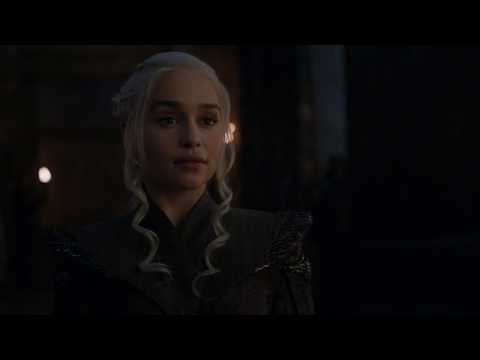

In [ ]:
#videoFile = "Game of Thrones 7x07 - Epic Daenerys Dragonpit Entrance.mp4"
#videoFile = "Melisandre meets Daenerys Targaryen.mp4"
videoFile = "Game of Thrones 3x10 Final Scene - Mhysa.mp4"

from IPython.display import HTML
from IPython.display import YouTubeVideo

#YouTubeVideo('403jzB62dAs') # "Game of Thrones 7x07 - Epic Daenerys Dragonpit Entrance.mp4"
#YouTubeVideo('sYqa3eAAYNI') # "Melisandre meets Daenerys Targaryen.mp4"
YouTubeVideo('zoTn9enVtAM') # "Game of Thrones 3x10 Final Scene - Mhysa.mp4"

#HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/403jzB62dAs?rel=0&amp;controls=0&amp;showinfo=0" frameborder="0" allowfullscreen></iframe>')
#HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/sYqa3eAAYNI?rel=0&amp;controls=0&amp;showinfo=0" frameborder="0" allowfullscreen></iframe>')

In [ ]:
import dsClass
from dsClass.align_custom import AlignCustom
from dsClass.face_feature import FaceFeature
from dsClass.mtcnn_detect import MTCNNDetect
from dsClass.tf_graph import FaceRecGraph
from dsClass.path_helper import *

In [ ]:
def read_image_from_url(url2read):
    if url2read.startswith('http'):
        req = urllib.request.urlopen(url2read)
        arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
        img = cv2.imdecode(arr, -1) # 'Load it as it is'
    else:
        img = cv2.imread(url2read)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return(img)

# Helper functions

In [ ]:
def annotate_face(rect, recog_data, frame):
    """
    Draw a box around the face and label the person
    :param rect : the face bounding box
    :param recog_data : tuple of person name and confidence percentage
    :param frame : the frame to draw on
    """
    shrtname = short_name(recog_data[0])
    acc = round(recog_data[1], 1)
    bbox_color = (255, 255, 255) if "Unknown" in recog_data[0] else (124,252,0)  # RGB

    #draw bounding box / fancy border for the face
    #cv2.rectangle(frame,(rect[0],rect[1]),(rect[0] + rect[2],rect[1]+rect[3]),bbox_color)
    draw_border(frame, (rect[0],rect[1]), (rect[0] + rect[2],rect[1]+rect[3]), bbox_color, 1, 10, 10)
    anot_text = shrtname + "-" + str(acc) + "%"
    cv2.putText(frame, anot_text,
                (rect[0]-4,rect[1]-4), cv2.FONT_HERSHEY_SIMPLEX,0.35,
                bbox_color, 1, cv2.LINE_AA)


def short_name(name):
    """e.g: Jaime Lannister -> Jaime.L"""
    if not name.startswith("Unknown"):
        name_split = name.split(" ")
        short_name = name_split[0]
        if len(name_split) > 1:
            short_name = short_name + "." + name_split[1][0]
        return(short_name)
    else:
        return name

#def short_name(name):
#    name_split = name.split(" ")
#    short_name = name_split[0]
#    if len(name_split) > 1:
#        short_name = short_name + "." + name_split[1][0]
#    return(short_name)


def draw_border(img, pt1, pt2, color, thickness, r, d):
    """
    Fancy box drawing function by Dan Masek
    Code in: https://www.codemade.io/fast-and-accurate-face-tracking-in-live-video-with-python/
    """
    x1, y1 = pt1
    x2, y2 = pt2

    # Top left drawing
    cv2.line(img, (x1 + r, y1), (x1 + r + d, y1), color, thickness)
    cv2.line(img, (x1, y1 + r), (x1, y1 + r + d), color, thickness)
    cv2.ellipse(img, (x1 + r, y1 + r), (r, r), 180, 0, 90, color, thickness)

    # Top right drawing
    cv2.line(img, (x2 - r, y1), (x2 - r - d, y1), color, thickness)
    cv2.line(img, (x2, y1 + r), (x2, y1 + r + d), color, thickness)
    cv2.ellipse(img, (x2 - r, y1 + r), (r, r), 270, 0, 90, color, thickness)

    # Bottom left drawing
    cv2.line(img, (x1 + r, y2), (x1 + r + d, y2), color, thickness)
    cv2.line(img, (x1, y2 - r), (x1, y2 - r - d), color, thickness)
    cv2.ellipse(img, (x1 + r, y2 - r), (r, r), 90, 0, 90, color, thickness)

    # Bottom right drawing
    cv2.line(img, (x2 - r, y2), (x2 - r - d, y2), color, thickness)
    cv2.line(img, (x2, y2 - r), (x2, y2 - r - d), color, thickness)
    cv2.ellipse(img, (x2 - r, y2 - r), (r, r), 0, 0, 90, color, thickness)

In [ ]:
# Generate face dictionary (database)
dict_faces = dict()
dict_faces["Jaime Lannister"] = ["https://s2.r29static.com//bin/entry/97f/340x408,85/1832698/image.jpg",
                                "https://upload.wikimedia.org/wikipedia/en/thumb/b/b4/Jaime_Lannister-Nikolaj_Coster-Waldau.jpg/220px-Jaime_Lannister-Nikolaj_Coster-Waldau.jpg",
                                 "https://upload.wikimedia.org/wikipedia/pt/thumb/0/06/Nikolaj-Coster-Waldau-Game-of-Thrones.jpg/220px-Nikolaj-Coster-Waldau-Game-of-Thrones.jpg",
                                 "https://purewows3.imgix.net/images/articles/2017_09/jaime-lannister-season-7-game-of-thrones-finale1.jpg?auto=format,compress&cs=strip&fit=min&w=728&h=404",
                                 "https://cdn.newsday.com/polopoly_fs/1.13944684.1502107079!/httpImage/image.jpeg_gen/derivatives/landscape_768/image.jpeg",
                                 "https://www.cheatsheet.com/wp-content/uploads/2017/08/Jaime-Lannister-Game-of-Thrones.png",
                                 "https://fsmedia.imgix.net/9c/c0/27/10/15e0/44a4/8ecb/9339993b563d/nikolaj-coster-waldau-as-jaime-lannister-in-game-of-thrones-season-7.png?rect=0%2C0%2C1159%2C580&dpr=2&auto=format%2Ccompress&w=650",
                                 "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQrIQuBKKUocAizwfWtIdhAcvfowLJatKqqDsO3ywYdh3rv-mBk"]


In [ ]:
dict_faces = dict()
dict_faces["Daenerys Targaryen"] = ["https://i.pinimg.com/originals/6c/5c/f5/6c5cf563639893ef3f22735e9d21550e.jpg",
                                   "https://i.pinimg.com/originals/d7/b3/24/d7b3241c1bc1a25c11cd95b4a4158b8e.jpg",
                                   "https://api.time.com/wp-content/uploads/2015/05/gameofthrones15_15.jpg?w=600&quality=85",
                                   'https://c4.wallpaperflare.com/wallpaper/414/301/201/game-of-thrones-5k-4k-8k-wallpaper-preview.jpg',
'https://rare-gallery.com/uploads/posts/509170-Daenerys-Targaryen.jpg',
'https://images.hdqwalls.com/wallpapers/daenerys-targaryen-4k-iu.jpg',
'https://c4.wallpaperflare.com/wallpaper/414/301/201/game-of-thrones-5k-4k-8k-wallpaper-preview.jpg',
'https://images.hdqwalls.com/wallpapers/daenerys-targaryen-4k-iu.jpg',
'https://rare-gallery.com/uploads/posts/509170-Daenerys-Targaryen.jpg',
'https://media1.popsugar-assets.com/files/thumbor/Ou35FwhVD-uIPJaX5Bud0uRqEZQ/fit-in/2048xorig/filters:format_auto-!!-:strip_icc-!!-/2015/09/09/951/n/1922283/bee60df6_gameofthrones15_27/i/Daenerys-Targaryen.jpg',
'https://static.wikia.nocookie.net/ironthronerp/images/b/b5/DaenerysTargaryen.jpg/revision/latest?cb=20150812234443',
'https://images.hdqwalls.com/wallpapers/dragon-daenerys-targaryen-1e.jpg',
'https://www.mujer.com.pa/sites/default/files/daenerys-targaryen.jpg',
'https://helios-i.mashable.com/imagery/articles/047hG2KmYXBbfreikBxNOwr/hero-image.fill.size_1248x702.v1623384354.jpg',
'https://helios-i.mashable.com/imagery/articles/047hG2KmYXBbfreikBxNOwr/hero-image.fill.size_1248x702.v1623384354.jpg',
'https://static.wikia.nocookie.net/game_of_thrones_-_the_storm_kings_fanon/images/5/56/Daenerys.jpg/revision/latest?cb=20200712010557',
'https://rare-gallery.com/uploads/posts/132534-khaleesi-emilia-clarke-daenerys-targaryen-hd.jpg',
'https://hellogiggles.com/wp-content/uploads/sites/7/2016/10/27/Emilia-Clarke-as-Daenerys-Targaryen-in-Game-of-Thrones1.jpg?quality=82&strip=all',
'https://awoiaf.westeros.org/images/c/ca/Daenerys_by_Hylora.JPG',
'https://rare-gallery.com/uploads/posts/125447-daenerys-targaryen-emilia-clarke-game-of-thrones-season-7-4k.jpg',
'https://static.wikia.nocookie.net/wrestling-for-life/images/e/e3/Daenerys_Targaryen.jpg/revision/latest?cb=20180707102517',
'https://www.tubefilter.com/wp-content/uploads/2017/07/daenerys-targaryen.jpg',
'https://cdn.vox-cdn.com/thumbor/_smdO8LTKp5PXA_k3BM_UpdHYdA=/1400x1050/filters:format(jpeg)/cdn.vox-cdn.com/uploads/chorus_asset/file/15378419/dany57.0.0.1551714243.jpg',
'https://upload.wikimedia.org/wikipedia/en/thumb/0/0d/Daenerys_Targaryen_with_Dragon-Emilia_Clarke.jpg/220px-Daenerys_Targaryen_with_Dragon-Emilia_Clarke.jpg',
'https://e1.pxfuel.com/desktop-wallpaper/591/430/desktop-wallpaper-daenerys-targaryen-game-of-thrones-women.jpg',
'https://images.hdqwalls.com/wallpapers/game-of-thrones-season-8-daenerys-targaryen-82.jpg',
'https://pbs.twimg.com/media/FMrpCjgXoAA1J48?format=jpg&name=360x360',
'https://pbs.twimg.com/media/FMrpC_0XsAMiUJV?format=jpg&name=360x360',
'https://pbs.twimg.com/media/FMrpDcqXoAMXIQ9?format=jpg&name=360x360',
'https://pbs.twimg.com/media/FMrpD5OXEAQHZe1?format=jpg&name=360x360',
'https://twitter.com/scenestargaryen/status/1498266082326597633',
'https://mediaproxy.salon.com/width/1200/https://media.salon.com/2019/05/game-of-thrones79.jpg',
'https://www.zbrushcentral.com/uploads/default/original/3X/f/d/fd334dd5163d6b517798641fde8290584cb29b90.jpeg',
'https://w0.peakpx.com/wallpaper/322/304/HD-wallpaper-emilia-clarke-lip-daenerys-targaryen-got-daenerys-game-of-thrones.jpg',
'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcS6MNZUYAEKMaCHLDkDv5wLmGbhTBEmHsuxfQ&usqp=CAU',
'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRi6F93RnC5LhgDCnZt96c6wS3PhbNFXTy4GA&usqp=CAU',
'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSWt3vKU47YCDV4OlXq95o2xEJUxUGF9_6j0g&usqp=CAU',
'https://sm.mashable.com/t/mashable_in/photo/default/6_q4ef.1248.jpg',
'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTIPoQLArJCFenCD4joEaBgIo82RHcDJBaCHg&usqp=CAU',
'https://hips.hearstapps.com/elle/assets/17/34/11_dany-dragon-inspired-s4.jpg',
'https://i.pinimg.com/originals/09/38/e4/0938e4ee11c1982971a1da451ed45f7b.jpg',
'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRlWHNyKz7cwbZpI90H-r6eUtYH7kz7-t-OSw&usqp=CAU',
'https://www.cnet.com/a/img/resize/dc6d35e5e77cd43dea33a3cd46b8dfc1fd8d2bd1/hub/2014/04/07/9a754364-c5f1-11e3-bddd-d4ae52e62bcc/gote_1.jpg?auto=webp&width=1200',
'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQryygsLBL1cROWuvorhFZykanDN2N5fiWAZw&usqp=CAU',
'https://lilyjackson.com.au/sydney/wp-content/uploads/2018/07/emilia-clarke-as-daenerys-targaryen.jpg',
'https://hellogiggles.com/wp-content/uploads/sites/7/2016/10/27/Emilia-Clarke-as-Daenerys-Targaryen-in-Game-of-Thrones1.jpg?quality=82&strip=1&resize=640%2C360',
'https://hellogiggles.com/wp-content/uploads/sites/7/2016/10/27/Emilia-Clarke-as-Daenerys-Targaryen-in-Game-of-Thrones1.jpg?quality=82&strip=1&resize=640%2C360',
'https://c4.wallpaperflare.com/wallpaper/576/680/873/tv-show-game-of-thrones-daenerys-targaryen-drogon-game-of-thrones-emilia-clarke-hd-wallpaper-preview.jpg',
'https://c4.wallpaperflare.com/wallpaper/446/294/401/daenerys-targaryen-game-of-thrones-digital-art-emilia-clarke-wallpaper-preview.jpg',
'https://c4.wallpaperflare.com/wallpaper/712/670/388/daenerys-targaryen-game-of-thrones-emilia-clarke-wallpaper-preview.jpg',
'https://c4.wallpaperflare.com/wallpaper/56/857/133/daenerys-targaryen-game-of-thrones-emilia-clarke-wallpaper-preview.jpg']

In [ ]:
dict_faces['Tyrion Lannister'] = ['https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR4Re6vnUjEBxywRkRLrCmTMLf4YMWUF19GYS3cbKuRzVoTCz1d&s',
                                  'https://www.hbo.com/content/dam/hbodata/series/game-of-thrones/character/s5/tyrion-lannister-1920.jpg/_jcr_content/renditions/cq5dam.web.1200.675.jpeg',
                                  'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/44ccdd999a4b20cdaef4696b8bf1a2c502db2b66f6909ae2a8a96a01a698370688e9b73dad75f0d33ea170c58a251155-1-1558322295.jpg?crop=0.668xw:1.00xh;0.0918xw,0&resize=480:*',
                                  'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/theory-1553634761.jpg?crop=0.501xw:1.00xh;0,0&resize=480:*',
                                  'https://fromheartopaper.files.wordpress.com/2019/09/picsart_09-11-02.35.13.png?w=1080',
                                  'https://upload.wikimedia.org/wikipedia/en/thumb/5/50/Tyrion_Lannister-Peter_Dinklage.jpg/220px-Tyrion_Lannister-Peter_Dinklage.jpg']

dict_faces['Euron Greyjoy'] = ['http://assets.viewers-guide.hbo.com/small597a20afe7893@2x.jpg',
                                'http://static1.squarespace.com/static/52fc05c9e4b08fc45bd99090/5331dfe2e4b0f77da2ddde51/5cd9bdc8cdc8f30001b28a0c/1557848897813/cq5dam.web.1280.1280.jpeg?format=1500w',
                                'https://vignette.wikia.nocookie.net/gameofthrones/images/f/fc/Euron-Profile.PNG/revision/latest?cb=20170916200257',
                                'https://images.radiox.co.uk/images/52162?crop=16_9&width=660&relax=1&signature=k6BDCtKEIBn0Vy8EeqjdLe_JpaI=',
                                'https://cdn.vox-cdn.com/thumbor/iGnjL2BCwm_o_iyLu40Y00IjU_s=/0x0:2560x1394/1200x0/filters:focal(0x0:2560x1394):no_upscale()/cdn.vox-cdn.com/uploads/chorus_asset/file/16220189/Screen_Shot_2019_05_06_at_7.25.08_AM.png']


dict_faces["Cersei Lannister"] = ['https://cdn.pastemagazine.com/www/articles/CERSEI-LANNISTER-quotes-list.jpg',
                                 'https://assets3.thrillist.com/v1/image/2823203/size/gn-gift_guide_variable_c.jpg',
                                 'https://s3-us-west-2.amazonaws.com/flx-editorial-wordpress/wp-content/uploads/2017/07/13060545/Cersei-Lannister.jpg',
                                 'https://www.thewrap.com/wp-content/uploads/2018/07/cersei_lannister-1.jpg',
                                 'https://imagesvc.timeincapp.com/v3/fan/image?url=https%3A%2F%2Fwinteriscoming.net%2Ffiles%2F2018%2F09%2FCersei-Lannister.jpg&w=736&h=485&c=sc',
                                 'https://s1.r29static.com/bin/entry/b52/720x864,85/2180384/image.webp'
                                'https://img1.looper.com/img/gallery/the-worst-things-cersei-lannister-has-ever-done/intro-1557760232.jpg',
                                  "https://metro.co.uk/wp-content/uploads/2017/08/game-of-thrones-cersei-main-2.jpg?quality=90&strip=all&crop=0px%2C0px%2C720px%2C378px&resize=1200%2C630",
                       "https://api.time.com/wp-content/uploads/2019/02/game-of-thrones-season-8-photos-03.jpg",
                       "https://i0.wp.com/metro.co.uk/wp-content/uploads/2018/05/game-of-thrones-cersei-main-3.jpg?quality=90&strip=all&zoom=1&resize=644%2C429&ssl=1",
                       "https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/cersei-euron-gift-1500579238.png?crop=0.563xw:1xh;center,top&resize=480:*",
                       "https://www.thewrap.com/wp-content/uploads/2018/07/cersei_lannister-1.jpg",
                       "https://cdn-www.konbini.com/en/files/2017/09/cersei-feat1.jpg",
                       "https://i.pinimg.com/originals/24/d1/fa/24d1fabf199c99f91435e2062a6d3926.jpg"]


dict_faces['Qyburn'] = ['https://i.ytimg.com/vi/1Tsjj9o47n0/maxresdefault.jpg',
                        'https://i.redd.it/mm9sgp28ri811.jpg',
                        'https://vignette.wikia.nocookie.net/gameofthrones/images/2/2a/Qyburn_3x01.jpg/revision/latest/top-crop/width/300/height/300?cb=20130502025950',
                        'https://vignette.wikia.nocookie.net/gameofthrones/images/8/8a/804_Qyburn_Profile.png/revision/latest?cb=20190508024406']
dict_faces['Jon Snow'] = ['https://www.esquireme.com/sites/default/files/styles/full_img/public/images/2019/05/20/Game-of-Thrones-Season-8-Ep-6-Finale-%284%29.png?itok=1LN_Lkkk',
                        'https://images2.minutemediacdn.com/image/upload/c_crop,h_840,w_1500,x_0,y_6/f_auto,q_auto,w_1100/v1555003564/shape/mentalfloss/jon_snow_hed.jpg',
                        'https://d.newsweek.com/en/full/507446/jon-snow-game-thrones.jpg',
                        'https://www.indiewire.com/wp-content/uploads/2019/04/Helen-Sloan-HBO-4-copy.jpg?w=780',
                        'https://cdn.vox-cdn.com/thumbor/o2AXRjdoyonKroOEsxQjYWvtG-U=/99x0:1179x810/1200x800/filters:focal(99x0:1179x810)/cdn.vox-cdn.com/uploads/chorus_image/image/46094226/Jon_snow.0.jpg',
                        'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/jon-snow-rhaegar-targaryen-1554321615.jpg?crop=0.482xw:0.962xh;0,0&resize=480:*',
                        'https://image.insider.com/5cb3c8e96afbee373d4f2b62?width=1100&format=jpeg&auto=webp',
                        'https://vignette.wikia.nocookie.net/gameofthrones/images/d/d0/JonSnow8x06.PNG/revision/latest?cb=20190714094440']


Checking: https://c4.wallpaperflare.com/wallpaper/414/301/201/game-of-thrones-5k-4k-8k-wallpaper-preview.jpg                                                                                                     
ERROR: Couldn't fetch https://c4.wallpaperflare.com/wallpaper/414/301/201/game-of-thrones-5k-4k-8k-wallpaper-preview.jpg, skipping this one
Checking: https://rare-gallery.com/uploads/posts/509170-Daenerys-Targaryen.jpg                                                                                                     
ERROR: Couldn't fetch https://rare-gallery.com/uploads/posts/509170-Daenerys-Targaryen.jpg, skipping this one
Checking: https://images.hdqwalls.com/wallpapers/daenerys-targaryen-4k-iu.jpg                                                                                                     
ERROR: Couldn't fetch https://images.hdqwalls.com/wallpapers/daenerys-targaryen-4k-iu.jpg, skipping this one
Checking: https://c4.wallpaperflare.com/wallpaper/414/301/201/game-of-th

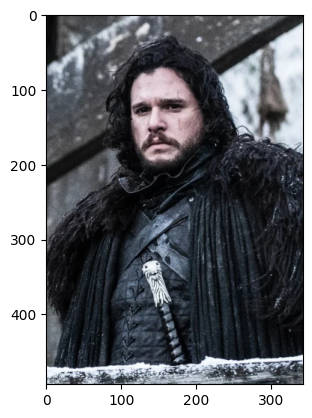

In [ ]:
# Check urls and print last image
# if any image causes problems (like error 403 forbidden) then remove it and choose another
for p in dict_faces.keys():
    urls = dict_faces[p]
    valid_urls = []
    for url2read in urls:
        print('\rChecking: %s' % url2read[:100], ' '*100, end='')
        try:
            img = read_image_from_url(url2read)
            valid_urls.append(url2read)
        except:
            print("\nERROR: Couldn't fetch %s, skipping this one" % url2read)
    dict_faces[p] = valid_urls
plt.imshow(img);

# Detect faces using Haar cascades

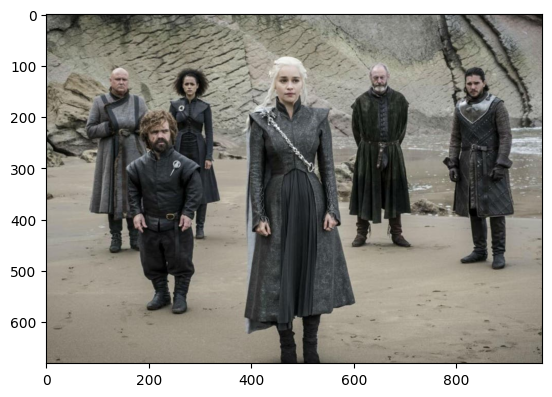

In [ ]:
got_faces_url = "https://static.independent.co.uk/s3fs-public/thumbnails/image/2018/05/10/12/game-of-thrones-finale.jpg?w968h681"
img = read_image_from_url(got_faces_url)
plt.imshow(img)
#img =read_image_from_url('https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/best-game-of-thrones-season-8-fan-theories-1554917935.jpg')


In [ ]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# Face Detection in image/frame using Haar

In [ ]:
def find_faces_in_image(orig_img, scaleFactor, minNeighbors, minSize, maxSize):
    orig_img_copy = orig_img
    #orig_img_copy = orig_img.copy()
    gray = cv2.cvtColor(orig_img_copy, cv2.COLOR_BGR2GRAY)
    #plt.imshow(gray)

    # Detect faces in the image
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=scaleFactor,
        minNeighbors=minNeighbors,
        minSize=minSize,
        maxSize=maxSize
    )

    print("Found {0} faces!".format(len(faces)))

    # Draw a rectangle around the faces
    for (x, y, w, h) in faces:
        cv2.rectangle(orig_img_copy, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(orig_img_copy)

    return faces


# Face Detection in a frame using Haar
def find_faces_in_frame_of_video(frame, scaleFactor, minNeighbors, minSize, maxSize):
    """Find faces in an image and returns a list of (x, y, w, h) tuples (the bounding boxes of them)"""
    """Find faces in an image and returns the bounding boxes of them"""

    # Detect faces in the image
    faces = find_faces_in_image(frame, scaleFactor, minNeighbors, minSize, maxSize)
    return faces

Found 1 faces!


array([[442, 104,  69,  69]], dtype=int32)

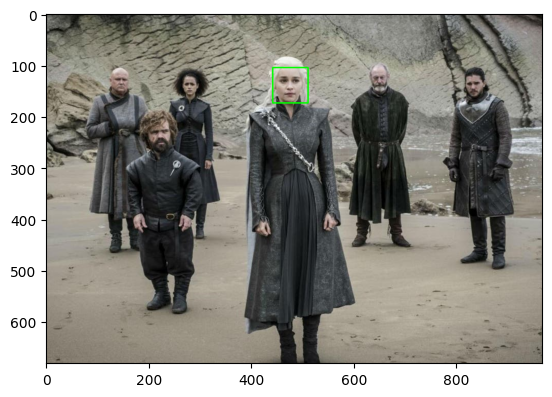

In [ ]:
#Face detection
#xxxxxxxxxxxxxx

scaleFactor = 1.3 #1.1
minNeighbors = 5  #3
minSize = (60, 60)  #(100, 100)
maxSize = (70, 70)  #(600, 600)
find_faces_in_image(img.copy(), scaleFactor, minNeighbors, minSize, maxSize)

# Face detection in video using Haar

In [ ]:
def video_file_recog_haar(src_filename, output_filename='output_haar.mp4', framerate=None, scaleFactor=1.3, minNeighbors=5, minSize=60, maxSize=70):

    print("[INFO] Reading video file ...")

    if glob.glob(src_filename):
        vs = cv2.VideoCapture(src_filename); #get input from file
    else:
        print("file does not exist")
        return

    print("[INFO] Initializing video writer...")

    frame_width = int(vs.get(3))
    #frame_width = int(vs.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(vs.get(4))
    #frame_height = int(vs.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v') # mp4v, DIVX, XVID, MJPG, X264, WMV1, WMV2, mp4v
    #fourcc = cv2.VideoWriter_fourcc(*'vp80') # for .webm

    if framerate is None:
        framerate = vs.get(cv2.CAP_PROP_FPS) # use same as input video, or can set to 20.0 / 30.0

    out = cv2.VideoWriter(output_filename, fourcc, framerate, (frame_width,frame_height))
    #out = cv2.VideoWriter(output_filename, fourcc, 20, (640, 480))

    recog_list = []
    frame_counter = 0
    t0 = time.time()

    while True:
        ret,frame = vs.read();
        if ret:
            frame_counter+=1
            if frame_counter%(30/framerate)==0:
                min_face_size = 60 #min face size is set to 60x60
                rects = find_faces_in_frame_of_video(frame, scaleFactor, minNeighbors, (minSize, minSize), (maxSize,maxSize))
                print("number of faces found in frame " + str(frame_counter) + ":",len(rects))
                #print("\rNumber of faces found in frame " + str(frame_counter) + ":",len(rects), end='')

                aligns = []
                positions = []
                for (i, rect) in enumerate(rects):
                    draw_border(frame, (rect[0],rect[1]), (rect[0] + rect[2],rect[1]+rect[3]), (255,255,255), 1, 10, 10)

                    cv2.putText(frame,"Unknown",  #No person identification
                                        (rect[0]-4,rect[1]-4),cv2.FONT_HERSHEY_SIMPLEX,0.35,
                                        (255,255,255),1,cv2.LINE_AA)

                out.write(frame)

                key = cv2.waitKey(1) & 0xFF
                if key == ord("q"):
                    break

        else: # end of video, no more frames
            break

    elapsed_time = time.time() - t0
    print()
    print("[exp msg] elapsed time for going over the video: " + str(time.strftime("%H:%M:%S", time.gmtime(elapsed_time))))

    vs.release()
    out.release()
    cv2.destroyAllWindows()

    print()
    print("Done")

Streaming output truncated to the last 5000 lines.
Found 0 faces!
number of faces found in frame 888: 0
Found 0 faces!
number of faces found in frame 891: 0
Found 0 faces!
number of faces found in frame 894: 0
Found 0 faces!
number of faces found in frame 897: 0
Found 0 faces!
number of faces found in frame 900: 0
Found 0 faces!
number of faces found in frame 903: 0
Found 0 faces!
number of faces found in frame 906: 0
Found 0 faces!
number of faces found in frame 909: 0
Found 0 faces!
number of faces found in frame 912: 0
Found 0 faces!
number of faces found in frame 915: 0
Found 0 faces!
number of faces found in frame 918: 0
Found 0 faces!
number of faces found in frame 921: 0
Found 0 faces!
number of faces found in frame 924: 0
Found 0 faces!
number of faces found in frame 927: 0
Found 0 faces!
number of faces found in frame 930: 0
Found 0 faces!
number of faces found in frame 933: 0
Found 0 faces!
number of faces found in frame 936: 0
Found 0 faces!
number of faces found in frame 93

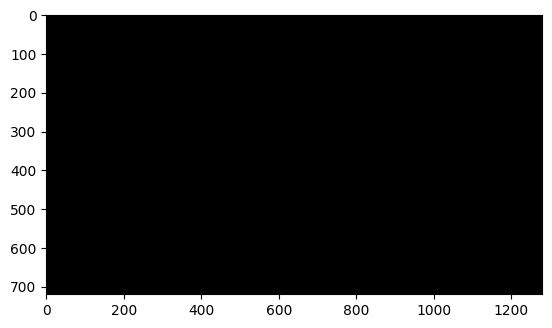

In [ ]:
video_file_recog_haar(src_filename = videoFile, #get_file_path(videoFile),
                      framerate=10,
                      scaleFactor=1.3,
                      minNeighbors=5,
                      minSize=60,
                      maxSize=70)

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/output_haar.mp4"

# Compressed video path
compressed_path = "/content/output_haar_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Detect using MTCNN

In [ ]:
# Generate Face dictionary/database Functions

# Save features on a file
def import_from_images():
    print()
    print("[INFO] Extracting data from images ...")
    data_set = dict()

    for new_name in dict_faces.keys():
        person_features = {"Left" : [], "Right": [], "Center": []};
        print("Extracting:",new_name)
        print("number of img files:",len(dict_faces[new_name]))
        person_imgs = get_person_imgs(dict_faces[new_name])
        if person_imgs is None:
            print("extraction of:",new_name, " failed")
            continue

        print("extracted person_imgs from:",new_name)

        for pos in person_imgs:
            person_features[pos] = [np.mean(extract_feature.get_features(person_imgs[pos]),axis=0).tolist()]
        data_set[new_name] = person_features;

    f = open('facerec_128D.txt', 'w+');
    f.write(json.dumps(data_set))

def augment_image(img):
    """Takes an image array and returns a list of its augmented versions"""
    aug_images = []
    flip_img = cv2.flip(img, 1)  #https://docs.opencv.org/2.4/modules/core/doc/operations_on_arrays.html?highlight=flip#cv2.flip
    # for more example see https://github.com/aleju/imgaug
    aug_images.append(flip_img)
    return(aug_images)


def get_person_imgs(urls, min_face_size=40):
    """
    Given a list of URLs of a person images, this function will extract and align the faces within the image and detect its pose (left/right/center)
    """
    person_imgs = {"Left" : [], "Right": [], "Center": []};
    person_imgs_count = {"Left" : 0, "Right": 0, "Center": 0};
    counter_break = 0
    while True:
        for url2read in urls:
            #print(file)
            #ret, frame = vs.read()
            #img = cv2.imread(file)
            img = read_image_from_url(url2read) # ****** file = url2read
            if img is None:
                print("********************* image was not loaded ***********************")
                continue

            # Augmenting the data - add a flipped version of the image to add more data
            frames = [img]
            frames.extend(augment_image(img))

            for frame in frames:
                if True: #ret:
                    #rects, landmarks = face_detect.detect_face(frame, 40);
                    rects, landmarks = face_detect.detect_face(frame, min_face_size) # min face size is set to 40x40
                    #print("rects", rects)
                    for (i, rect) in enumerate(rects):
                        aligned_frame, pos = aligner.align(160,frame,landmarks[i]);
                        #print(pos)
                        person_imgs_count[pos]+=1
                        if len(aligned_frame) == 160 and len(aligned_frame[0]) == 160:
                            person_imgs[pos].append(aligned_frame)
                            #cv2.imshow("Captured face", aligned_frame)
                            #cv2.imwrite("../data2/frame%d.jpg" % count, aligned_frame)
                    key = cv2.waitKey(1) & 0xFF
                    if key == ord("q"):
                        break
                else:
                    break

        if person_imgs_count["Left"] == 0 or person_imgs_count["Right"] == 0 or person_imgs_count["Center"] == 0:
            counter_break+=1
            if counter_break > 3: #0
                print(person_imgs_count)
                assert 0==1, "Must get all poses of a face: Left, Right and Center, try adding more images"
                return None
        else:
            break

    print(person_imgs_count)
    return(person_imgs)


def video_file_recog():
    print("[INFO] Reading video file ...")
    video_file = videoFile #get_file_path(videoFile)
    if glob.glob(video_file):
        vs = cv2.VideoCapture(video_file); #get input from file
    else:
        print("file does not exist")
        return

    frame_width = int(vs.get(3))
    frame_height = int(vs.get(4))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    framerate = 30.0
    out = cv2.VideoWriter('output.mp4', fourcc, framerate, (frame_width,frame_height))

    frame_counter = 0
    unknown_counter = 0
    known_counter = 0
    t0 = time.time()
    while True:
        ret,frame = vs.read();
        if ret:
            frame_counter+=1
            if frame_counter%(30/framerate)==0:
                min_face_size = 80 #min face size is set to 80x80
                rects, landmarks = face_detect.detect_face(frame,min_face_size);
                print("number of faces found in frame " + str(frame_counter) + ":",len(rects))
                aligns = []
                positions = []
                for (i, rect) in enumerate(rects):
                    aligned_face, face_pos = aligner.align(160,frame,landmarks[i])
                    if len(aligned_face) == 160 and len(aligned_face[0]) == 160:
                        aligns.append(aligned_face)
                        positions.append(face_pos)
                    else:
                        print("Align face failed") #log
                if(len(aligns) > 0):
                    features_arr = extract_feature.get_features(aligns)
                    recog_data = findPeople(features_arr,positions);
                    print("recog_data", str(recog_data))
                    for (i,rect) in enumerate(rects):
                        shrtname = short_name(recog_data[i][0])
                        acc = round(recog_data[i][1],1)
                        if "Unknown" in recog_data[i][0]:
                            unknown_counter+=1
                            #draw bounding box for the face
                            draw_border(frame, (rect[0],rect[1]), (rect[0] + rect[2],rect[1]+rect[3]), (255,255,255), 1, 10, 10)
                            cv2.putText(frame,shrtname+"-"+str(round(recog_data[i][1],1))+"%",
                                        (rect[0]-4,rect[1]-4),cv2.FONT_HERSHEY_SIMPLEX,0.35,
                                        (255,255,255),1,cv2.LINE_AA)
                        else:
                            known_counter+=1
                            # draw a fancy border around the faces
                            draw_border(frame, (rect[0],rect[1]), (rect[0] + rect[2],rect[1]+rect[3]), (124,252,0), 1, 10, 10)
                            #draw bounding box for the face
                            cv2.putText(frame,shrtname+"-"+str(round(recog_data[i][1],1))+"%",
                                        (rect[0]-4,rect[1]-4),cv2.FONT_HERSHEY_SIMPLEX,0.35,
                                        (124,252,0),1,cv2.LINE_AA)

            out.write(frame)
            key = cv2.waitKey(1) & 0xFF
            if key == ord("q"):
                break
        else:
            break

    elapsed_time = time.time() - t0
    print("[exp msg] elapsed time for going over the video: " + str(time.strftime("%H:%M:%S", time.gmtime(elapsed_time))))
    vs.release()
    out.release()
    cv2.destroyAllWindows()
    print("known_counter:",known_counter, "unknown_counter:",unknown_counter)

    print()
    print("Done")



def findPeople(features_arr, positions, thres = 0.6, percent_thres = 70):
    '''
    :param features_arr: a list of 128d Features of all faces on screen
    :param positions: a list of face position types of all faces on screen
    :param thres: distance threshold
    :return: person name and percentage
    '''
    f = open('facerec_128D.txt','r')
    data_set = json.loads(f.read());
    returnRes = [];
    for (i,features_128D) in enumerate(features_arr):
        result = "Unknown";
        smallest = sys.maxsize
        for person in data_set.keys():
            person_data = data_set[person][positions[i]];
            for data in person_data:
                distance = np.sqrt(np.sum(np.square(data-features_128D)))
                if(distance < smallest):
                    smallest = distance;
                    result = person;
        percentage =  min(100, 100 * thres / smallest)
        if percentage <= percent_thres :
            result = "Unknown"
        returnRes.append((result,percentage))
    return returnRes

In [ ]:
#RUN Network Based Detection and Recognition
model_path = "model-20170512-110547.ckpt-250000"

# initialize
FRGraph = FaceRecGraph();
aligner = AlignCustom();
#extract_feature = FaceFeature(FRGraph, model_path = model_path);
extract_feature = FaceFeature(FRGraph,model_path)
face_detect = MTCNNDetect(FRGraph, scale_factor=2); #scale_factor, rescales image for faster detection

Loading model...


/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use 

Model loaded
Loading MTCNN Face detection model
MTCNN Model loaded


In [ ]:
#Generate face database
#-----------------------
import_from_images()


[INFO] Extracting data from images ...
Extracting: Daenerys Targaryen
number of img files: 26
{'Left': 14, 'Right': 13, 'Center': 20}
extracted person_imgs from: Daenerys Targaryen
Extracting: Tyrion Lannister
number of img files: 4
{'Left': 3, 'Right': 3, 'Center': 2}
extracted person_imgs from: Tyrion Lannister
Extracting: Euron Greyjoy
number of img files: 5
{'Left': 3, 'Right': 3, 'Center': 4}
extracted person_imgs from: Euron Greyjoy
Extracting: Cersei Lannister
number of img files: 11
{'Left': 3, 'Right': 3, 'Center': 18}
extracted person_imgs from: Cersei Lannister
Extracting: Qyburn
number of img files: 4
{'Left': 2, 'Right': 2, 'Center': 4}
extracted person_imgs from: Qyburn
Extracting: Jon Snow
number of img files: 7
{'Left': 5, 'Right': 3, 'Center': 6}
extracted person_imgs from: Jon Snow


# Recognition in video file - MTCNN - 1

In [ ]:
video_file_recog()

[INFO] Reading video file ...
number of faces found in frame 1: 0
number of faces found in frame 2: 0
number of faces found in frame 3: 0
number of faces found in frame 4: 0
number of faces found in frame 5: 0
number of faces found in frame 6: 0
number of faces found in frame 7: 0
number of faces found in frame 8: 0
number of faces found in frame 9: 0
number of faces found in frame 10: 0
number of faces found in frame 11: 0
number of faces found in frame 12: 0
number of faces found in frame 13: 0
number of faces found in frame 14: 0
number of faces found in frame 15: 0
number of faces found in frame 16: 0
number of faces found in frame 17: 0
number of faces found in frame 18: 0
number of faces found in frame 19: 0
number of faces found in frame 20: 0
number of faces found in frame 21: 0
number of faces found in frame 22: 0
number of faces found in frame 23: 0
number of faces found in frame 24: 0
number of faces found in frame 25: 0
number of faces found in frame 26: 0
number of faces f

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/output.mp4"

# Compressed video path
compressed_path = "/content/output_compressed.mp4"

#os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")
os.system(f"ffmpeg -hide_banner -i {save_path} -b:v 200k -y {compressed_path}")


# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
#Global Variables
person_embeddings = None

In [ ]:
def extract_embeddings_from_images(min_face_size=40, embeddings_filename='facerec_128D.txt'):
    """
    Go over all urls, extract and align faces, feed each face to the embeddings net,
    and saves an embedding vector for each person-position pair.
    Save all embeddings to a .txt file
    """
    print()
    print("[INFO] Extracting data from images ...")
    data_set = dict()

    for new_name in dict_faces.keys():
        person_features = {"Left" : [], "Right": [], "Center": []};
        print("Extracting:", new_name)
        print("number of img files:",len(dict_faces[new_name]))
        person_imgs = get_person_imgs(dict_faces[new_name], min_face_size=min_face_size)
        if person_imgs is None:
            print("extraction of:",new_name, " failed")
            continue

        print("extracted person_imgs from:",new_name)
        print("-------------------------------------")

        for pos in person_imgs: # there are some exceptions here, but I'll just leave it as this to keep it simple
            person_features[pos] = [np.mean(extract_feature.get_features(person_imgs[pos]), axis=0).tolist()]
        data_set[new_name] = person_features;

    global person_embeddings
    person_embeddings = data_set
    with open(embeddings_filename, 'w+') as f:
        f.write(json.dumps(data_set))



#def load_embeddings_from_file(embeddings_filename='facerec_128D.txt'):
#    global person_embeddings
#    with open(embeddings_filename, 'r') as f:
#        person_embeddings = json.loads(f.read());


def identifyPerson(features_arr, position, thres = 0.6, percent_thres = 70):
    '''
    :param features_arr: a list of 128d Features of a face
    :param position: face position types (Left/Right/Center)
    :param thres: distance threshold
    :param percent_thres : minimum confidence required to identify a person
    :return: tuple of person name and confidence of detection
    '''
    assert person_embeddings is not None, "Must load or extract persons embeddings in order to recgonize persons"
    result = "Unknown"
    smallest = sys.maxsize  # initialize with a large number
    for person in person_embeddings.keys():
        person_data = person_embeddings[person][position]
        for data in person_data:  # in our case there's only one embedding per person-position pair

            distance = scipy.spatial.distance.euclidean(data, features_arr)  # same as: np.sqrt(np.sum(np.square(data-features_arr)))
            #distance = scipy.spatial.distance.cosine(data, features_arr)  # if using cosine distance it is recommended to lower the thres to ~0.4

            if(distance < smallest):
                smallest = distance
                result = person
                identified = True
    percentage =  min(100, 100 * thres / smallest)
    if percentage <= percent_thres:
        result = "Unknown (%s)" % result.split(' ')[0]  # show highest score person for debug purposes
        identified = False
    return (identified, result, percentage)

In [ ]:
#Generate face database
#----------------------
#load_embeddings_from_file()
extract_embeddings_from_images(min_face_size=40)  # Before hand: Feature of person to be tracked


[INFO] Extracting data from images ...
Extracting: Daenerys Targaryen
number of img files: 26
{'Left': 14, 'Right': 13, 'Center': 20}
extracted person_imgs from: Daenerys Targaryen
-------------------------------------
Extracting: Tyrion Lannister
number of img files: 4
{'Left': 3, 'Right': 3, 'Center': 2}
extracted person_imgs from: Tyrion Lannister
-------------------------------------
Extracting: Euron Greyjoy
number of img files: 5
{'Left': 3, 'Right': 3, 'Center': 4}
extracted person_imgs from: Euron Greyjoy
-------------------------------------
Extracting: Cersei Lannister
number of img files: 11
{'Left': 3, 'Right': 3, 'Center': 18}
extracted person_imgs from: Cersei Lannister
-------------------------------------
Extracting: Qyburn
number of img files: 4
{'Left': 2, 'Right': 2, 'Center': 4}
extracted person_imgs from: Qyburn
-------------------------------------
Extracting: Jon Snow
number of img files: 7
{'Left': 5, 'Right': 3, 'Center': 6}
extracted person_imgs from: Jon Sno

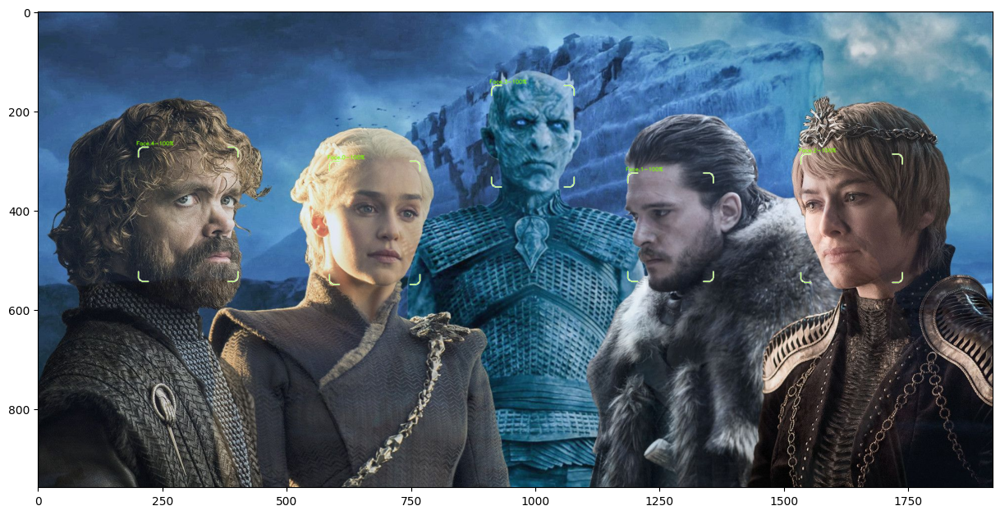

In [ ]:
# Face detection
#xxxxxxxxxxxxxxx

url = 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/best-game-of-thrones-season-8-fan-theories-1554917935.jpg'
frame = read_image_from_url(url)
#frame = cv2.resize(frame, (640, 480))
rects, landmarks = face_detect.detect_face(frame, minsize=40);  # min face size is set to 80x80


for rect in rects:
    draw_border(frame, (rect[0],rect[1]), (rect[0] + rect[2],rect[1]+rect[3]), (255,255,255), 2, 10, 10)


for i, rect in enumerate(rects):
    #draw_border(frame, (rect[0],rect[1]), (rect[0] + rect[2],rect[1]+rect[3]), (255,255,255), 2, 10, 10)
    annotate_face(rect, ('Face %i' % i, 100), frame)


plt.subplots(figsize=(15,10))
plt.imshow(frame);

In [ ]:
# Landmarks
#idx = 0
#rect = rects[idx]
#plt.imshow(frame[rect[1]:rect[1]+rect[3],rect[0]:rect[0]+rect[2]])
#for k in range(int(len(landmarks[idx]) / 2)):
#    plt.plot(landmarks[idx][k]-rect[0], landmarks[idx][k+5]-rect[1], 'r+', markersize=20)

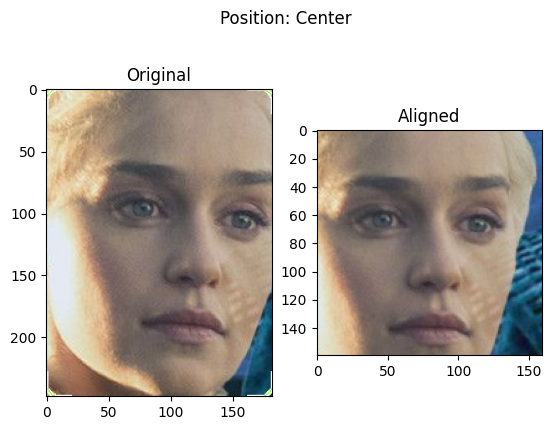

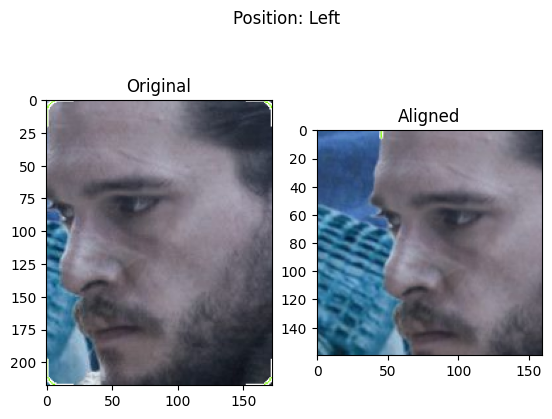

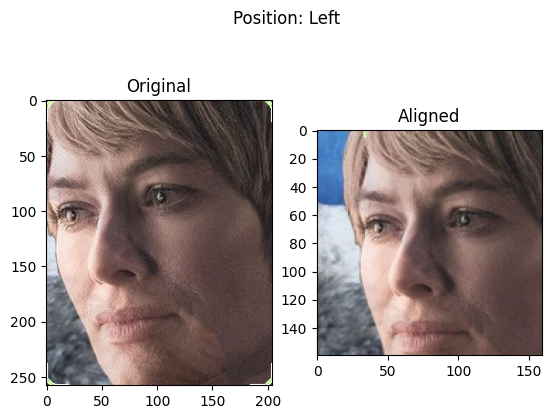

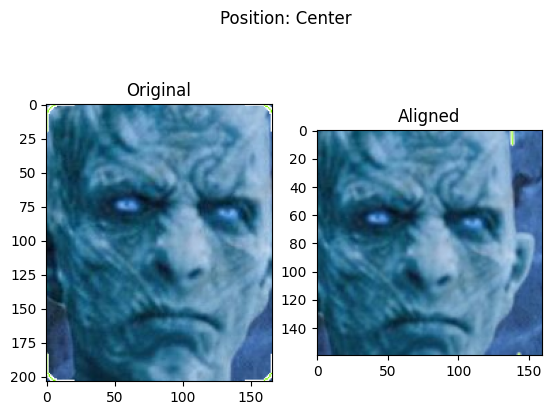

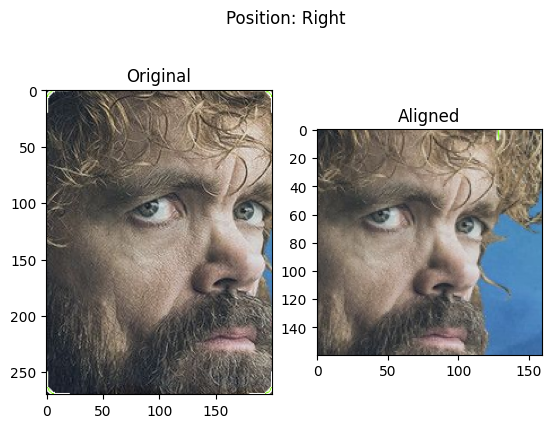

In [ ]:
# Align Face
for (i, rect) in enumerate(rects):
    aligned_frame, pos = aligner.align(160, frame, landmarks[i])
    plt.subplot(121)
    plt.imshow(frame[rect[1]:rect[1]+rect[3],rect[0]:rect[0]+rect[2]])
    plt.title('Original')
    plt.subplot(122)
    plt.imshow(aligned_frame)
    plt.title('Aligned')
    plt.suptitle('Position: %s' % pos)
    plt.show()

In [ ]:
# Feature extraction
#--------------------
features_vector = extract_feature.get_features([aligned_frame])

In [ ]:
features_vector.shape

(1, 128)

In [ ]:
features_vector

array([[ 3.06947865e-02,  2.46337689e-02,  3.27971801e-02,
         5.13083562e-02,  1.14294544e-01, -7.94433057e-02,
        -1.23993270e-02,  5.47814230e-03,  6.24713600e-02,
         9.07374844e-02, -2.81489342e-02,  8.82888064e-02,
         1.37545645e-01, -3.88540216e-02, -1.00415751e-01,
        -7.15223094e-03,  3.00297476e-02, -6.97415322e-02,
         3.52026597e-02,  1.43434525e-01,  1.17189884e-01,
         5.46271913e-02,  3.03279757e-02,  5.10573834e-02,
         4.49247807e-02, -5.81973121e-02, -3.98896672e-02,
         3.49038169e-02, -1.46929622e-02,  5.63431084e-02,
         8.54653940e-02, -7.28793964e-02, -2.73796613e-04,
        -6.02633171e-02,  1.26561234e-02, -1.13923676e-01,
        -2.81415340e-02, -3.31248082e-02, -2.03064382e-02,
         9.62149575e-02, -5.79526722e-02,  7.93640241e-02,
        -4.65060435e-02,  1.00796200e-01, -4.40883972e-02,
         5.41108921e-02, -2.19763480e-02,  5.01704626e-02,
        -8.18001106e-02,  1.25169158e-01, -1.49418175e-0

In [ ]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.)

emotion_dict = {0: "Angry", 1: "Disgusted", 2: "Fearful", 3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"}
model = tf.keras.models.load_model("my_model1")

NameError: ignored

In [ ]:
# Face Recognition in Video using MTCNN, aligner and embedded vectors

def frame_face_recog(frame, min_face_size=80, percent_thres = 70, verbose=False):
    """
    Detect faces in a frame, try to recognize them, and draws a box around the face with predicted person + % confidence
    :param frame : the frame to indentify faces in. an array with shape of width X height X channels
    :param min_face_size : minimum size of face to detect. integer. e.g: value of 80 is set to 80x80 pixels
    :param verbose : True to print debug information while running

    Alters inplace the frame with predictions annotations
    returns a list of (person,confidence) tuples
    """
    aligner_resize_to = 160  # the aligner function will rescale image to X by X pixels before sent to be embedded.

    recog_list = []

    # Detect all faces in frame and get their bounding-rectangles and landmarks
    rects, landmarks = face_detect.detect_face(frame, minsize=40);  # min face size is set to 80x80

    # Go through each face in frame and perform:
    #  1) align the face (using aligner.align() function). remember that aligner.align() returns the aligned-face and face-pose (left/right/center)
    #  2) extract aligned face features (embeddings)
    #  3) find the person the face belongs to
    #  4) draw a box around the face and label the person
    for (i, rect) in enumerate(rects):
        if verbose: print('BBox %i:' % i, end=' ')
        aligned_frame, pos = aligner.align(160, frame, landmarks[i]) #1:
        #aligned_face, face_pos =
        features_vector = extract_feature.get_features([aligned_frame]) #2:
        #features_arr =
        print(features_vector.shape)
        recog_data = identifyPerson(features_vector,pos, percent_thres = percent_thres) #3:
        recog_list.append(recog_data)

        # Emotion recognition
        if (recog_data[0] == True) & (pos == 'Center'):  #Identified person -- Face facing front (i.e., center)
            test = cv2.cvtColor(aligned_frame.copy(), cv2.COLOR_BGR2GRAY)

            b = np.empty((1,48, 48, 1))
            b[0,:,:,0] = cv2.resize(test, (48,48), interpolation = cv2.INTER_AREA)

            preds = model.predict(b)
            idx = np.argmax(preds, axis = 1)

            #print(emotion_dict[idx[0]])
            y = list(recog_data)
            y[1] = emotion_dict[idx[0]]

            recog_data = tuple(y)


        if verbose : print ("recog_data", str((recog_data[1],recog_data[2])))
        annotate_face(rect, (recog_data[1],recog_data[2]), frame)   #4:

        #print(recog_data)

    return recog_list

(1, 128)
1/1 [==============================] - 0s 190ms/step
(1, 128)
(1, 128)
(1, 128)
(1, 128)


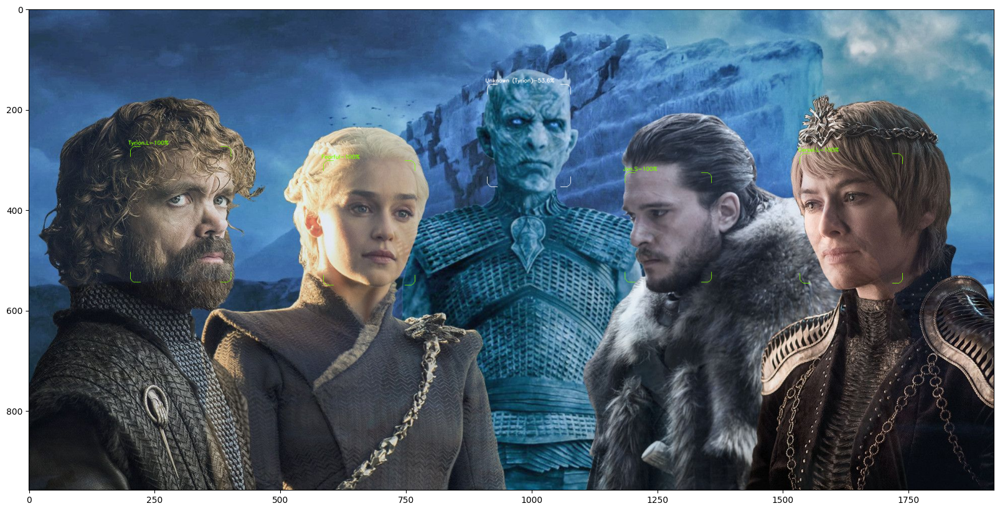

In [ ]:
# Face detection (shorter than above) - Test function above
#xxxxxxxxxxxxxxx

#url = 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/best-game-of-thrones-season-8-fan-theories-1554917935.jpg'
url = 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/best-game-of-thrones-season-8-fan-theories-1554917935.jpg'

frame = read_image_from_url(url)
frame_face_recog(frame)
#frame_face_recog(frame, min_face_size=80, percent_thres = 70)

plt.subplots(figsize=(20,15))
#plt.subplots(figsize=(15,10))

plt.imshow(frame);

In [ ]:
frame.shape

(958, 1920, 3)

In [ ]:
def video_file_recog(src_filename, output_filename='output2.mp4', percent_thres = 70, verbose=False):

    ## Insert GUI setup

    print("[INFO] Reading video file...")
    if glob.glob(src_filename):
        vs = cv2.VideoCapture(src_filename); #get input from file
    else:
        print("file does not exist")
        return

    print("[INFO] Initializing video writer...")
    frame_width = int(vs.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(vs.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v') # DIVX, XVID, MJPG, X264, WMV1, WMV2, mp4v
    framerate = vs.get(cv2.CAP_PROP_FPS) # use same as input video, or can set to 20.0 / 30.0
    out = cv2.VideoWriter(output_filename, fourcc, framerate, (frame_width,frame_height))

    recog_list = []
    frame_counter = 0
    t0 = time.time()
    while True:
        ret, frame = vs.read();
        if ret:
            frame_counter += 1
            print('\rProcessing Frame %i/%i' % (frame_counter, total_frames), end=' ')
            recog_data = frame_face_recog(frame, min_face_size=40, percent_thres=percent_thres, verbose=verbose)
            recog_list.extend(recog_data)
            #cv2.imshow("Frame",frame)
            #cv2.imwrite("../data3/frame%d.jpg" % count, frame)
            out.write(frame)
        else:  # end of video, no more frames
            break

    elapsed_time = time.time() - t0
    print()
    print("[exp msg] elapsed time for going over the video: " + str(time.strftime("%H:%M:%S", time.gmtime(elapsed_time))))
    vs.release()
    out.release()
    cv2.destroyAllWindows()

    known_counter = len([1 for recog in recog_list if recog[2] > percent_thres])
    unknown_counter = len(recog_list) - known_counter
    print("known_counter:", known_counter, "unknown_counter:", unknown_counter)

    print()
    print("Done")

In [ ]:
# GUI
#xxxxx

# TO BE THE MAIN OF GUI.
i = 0
while True:
    event, values = window.read(timeout=0.0001)
    #event, value = window.read(timeout=400)
    if event == "Exit" or event == sg.WIN_CLOSED:
        cap.release()
        cv2.destroyAllWindows()
        break

    # Check if camera opened successfully
    SetLED(window, '-CAMERA-CLOSED-', 'green' if (cap.isOpened()== False) else 'red')
    if (cap.isOpened()== False):
        print("Error opening video stream or file")
        #break
    else:
        ret, frame = cap.read()


        SetLED(window, '-NOT-FOUND-', 'green' if ret == False else 'red') #For ret=True
        #print(ret)
        if ret == True:

    # if values["-THRESH-"]:
    #     frame = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)[:, :, 0]
    #     frame = cv2.threshold(
    #         frame, values["-THRESH SLIDER-"], 255, cv2.THRESH_BINARY
    #     )[1]
    # elif values["-CANNY-"]:
    #     frame = cv2.Canny(
    #         frame, values["-CANNY SLIDER A-"], values["-CANNY SLIDER B-"]
    #     )
    # elif values["-BLUR-"]:
    #     frame = cv2.GaussianBlur(frame, (21, 21), values["-BLUR SLIDER-"])
    # elif values["-HUE-"]:
    #     frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    #     frame[:, :, 0] += int(values["-HUE SLIDER-"])
    #     frame = cv2.cvtColor(frame, cv2.COLOR_HSV2BGR)
    # elif values["-ENHANCE-"]:
    #     enh_val = values["-ENHANCE SLIDER-"] / 40
    #     clahe = cv2.createCLAHE(clipLimit=enh_val, tileGridSize=(8, 8))
    #     lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    #     lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    #     frame = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)


     #####
            received_image=np.copy(frame)
            #print(received_image.shape)

# Recognition in video file - MTCNN - 2

In [ ]:
# Run video generation
video_file_recog(src_filename = get_file_path(videoFile), percent_thres=70, verbose=False)

[INFO] Reading video file...
[INFO] Initializing video writer...
1/1 [==============================] - 0s 45ms/step
Processing Frame 3297/3297 
[exp msg] elapsed time for going over the video: 00:02:46
known_counter: 60 unknown_counter: 1029

Done


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/output2.mp4"

# Compressed video path
compressed_path = "/content/output2_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

FileNotFoundError: ignored

In [ ]:
# the output file from opencv is just video frames (Without audio). lets add the original audio track to the output movie
# if ffmpeg is not installed then it will return False
#vid2vid_audio_transfer(videoFile, 'output2.mp4', 'output_w_audio.mp4');